# 3. Fitting diads once you have groups
- Once you have divided your diads into groups based on strengths, you need to tweak the fit parameters for each group
- Then you can loop through all files in a given group and automatically fit the spectra

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import DiadFit as pf
pf.__version__

'0.0.78'

## Specifying filetype, and folder as before

In [7]:
# This specifies what file type your Raman exported in. 
meta_path, spectra_path, spectra_filetype, prefix, str_prefix, spectra_file_ext, meta_file_ext, TruPower=pf.get_settings()

## Load in data and fit parameters
- This loads in the dataframes of the fit parameters you saved in the other file, by group
- At this point you select what group you want to fit (batch = 'Weak', 'Medium' or 'Strong'). After running through the entire notebook for one group, come back up here to fit a second group.

In [8]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')

# Select the group you want to fit ('Weak', 'Medium', 'Strong'). After selecting one, go through and select another one and run again from here. 
batch='Weak' # Options are Weak, Medium, Strong

if batch=='Weak':
    GroupN_df=joblib.load('Weak_df.sav')
if batch=='Medium':
    GroupN_df=joblib.load('Medium_df.sav')
if batch=='Strong':
    GroupN_df=joblib.load('Strong_df.sav')

### Now load one file from this group to tweak parameters for

In [9]:
Diad_Files =GroupN_df['filename']
i=0


### Lets plot the diad to have a look at it

I flipped


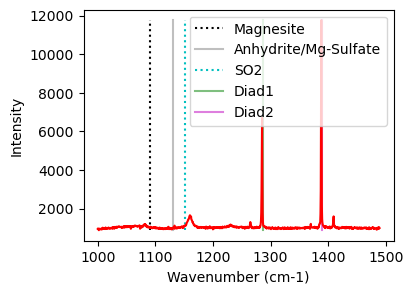

In [10]:
plot1=pf.plot_diad(path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype)

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

## Choose a model for fitting all peaks
- Option of Voigt or PseudoVoigt. We recomend PsuedoVoigt

In [18]:
model_name='PseudoVoigtModel'

## Fit Diad 1
- Tweak the parameters in the config files for each group. E.g. how many peaks (fit_peaks), the background positions, the sigma of the diad, and whether or not you want a gaussian background

In [23]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

if batch=='Weak':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1310, 1350),
    diad_sigma=1.1,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init


if batch=='Medium':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Strong':
    diad1_fit_config_init=pf.diad1_fit_config(
    fit_gauss=True, gauss_amp= 2*GroupN_df['HB1_abs_prom'].iloc[i],
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220), upper_bck_diad1=(1310, 1350), fit_gauss=False, gauss_amp=1000, diad_sigma=1.1, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=787.4966807758119, HB_prom=nan, x_range_baseline=30, y_range_baseline=1000, dpi=200, x_range_residual=10, return_other_params=False)

### See what these fit parameters look like for diad1

I flipped
I flipped
I flipped


,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_cent_err,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Diad1_Combofit_Height,Diad1_Residual,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit
0,1285.061438,1285.061438,0.004673,9144.91716,0.56332,0,5887.909823,40.695655,0.712213,1.12664,Flagged Warnings:


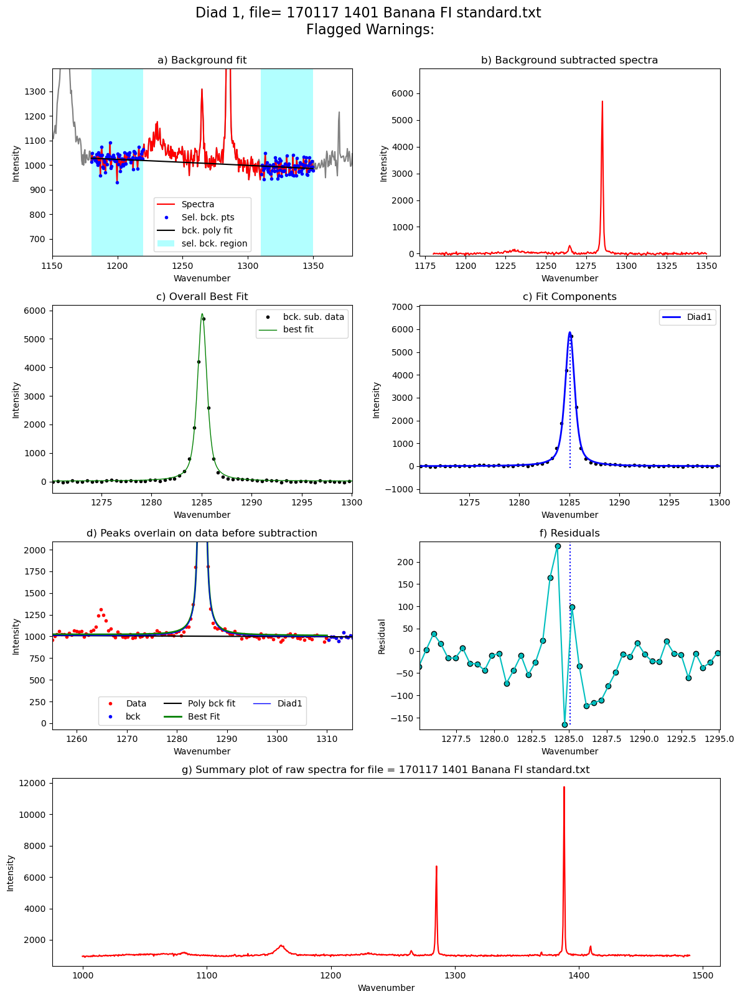

In [24]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=Diad_Files.iloc[0],
filetype=filetype, plot_figure=True, close_figure=False,
Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
Diad1_fit

### Update the sigma
- The sigma parameter varies quite a lot based on the splitting. Best to update your first guess with what you found for the example file above

In [25]:
diad1_fit_config2=diad1_fit_config_init

## Fit diad2

In [33]:
if batch=='Weak':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2, upper_bck_diad2=(1420, 1450),
    lower_bck_diad2=(1310, 1360),diad_sigma=1,  N_poly_bck_diad2=1,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Medium':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2,
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=1,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Strong':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad2=1, lower_bck_diad2=(1310, 1360), upper_bck_diad2=(1420, 1450), fit_gauss=False, gauss_amp=1000, diad_sigma=1, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=1369.8367228083084, HB_prom=73.89011756752109, x_range_baseline=30, y_range_baseline=1000, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False, C13_prom=10)

### See what these fit parameters look like for diad2

I flipped
I flipped
I flipped


,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_cent_err,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,HB2_Cent,HB2_Area,HB2_Sigma,Diad2_Combofit_Height,Diad2_Residual,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit
0,1388.395992,1388.395942,0.006731,1704.574073,0.44336,0,1409.986705,136.931268,0.651613,1449.743837,15.403224,0.611961,0.886719,Flagged Warnings:


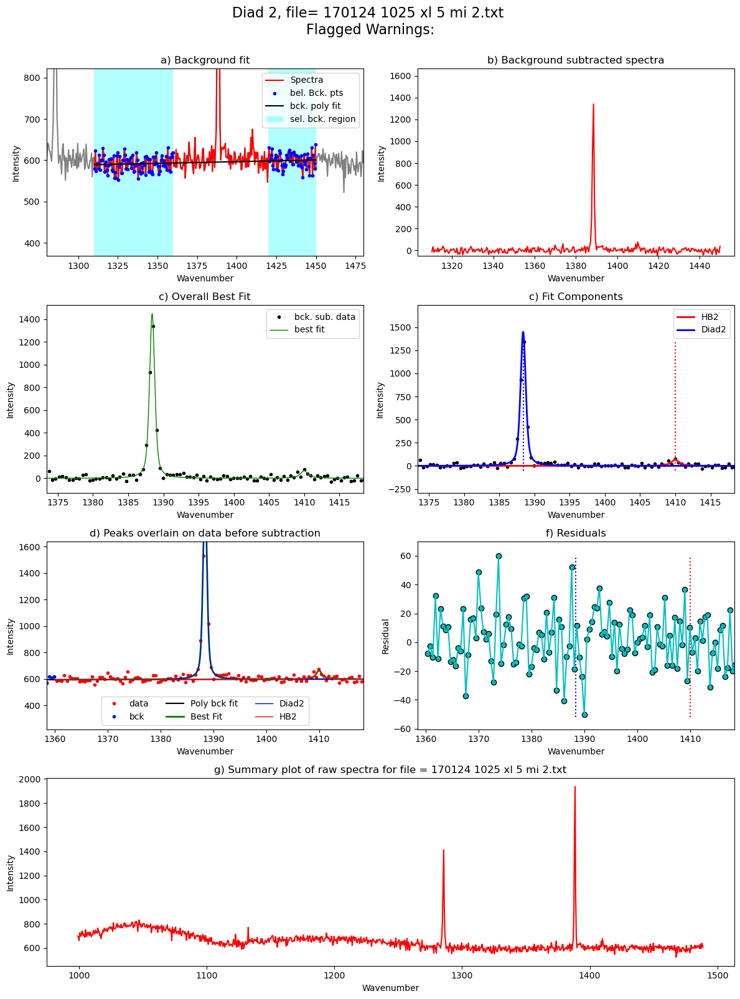

In [34]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype,
plot_figure=True, close_figure=False, 
Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

## Loop over all the files in the group
- This will loop over all the 

  0%|          | 0/21 [00:00<?, ?it/s]

Processing file: 170117 1401 Banana FI standard.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


  5%|▍         | 1/21 [00:02<00:49,  2.48s/it]

Processing file: 170117 1411 xl 1 mi 1.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 10%|▉         | 2/21 [00:04<00:40,  2.14s/it]

Processing file: 170117 1417 xl 2 mi 1.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 14%|█▍        | 3/21 [00:06<00:35,  2.00s/it]

Processing file: 170117 1430 xl 2 mi 2.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 19%|█▉        | 4/21 [00:08<00:35,  2.08s/it]

Processing file: 170117 1449 xl 2 mi 3.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 24%|██▍       | 5/21 [00:10<00:34,  2.16s/it]

Processing file: 170117 1456 xl 3 mi 1.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 29%|██▊       | 6/21 [00:12<00:30,  2.05s/it]

Processing file: 170117 1502 xl 3 mi 2.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 33%|███▎      | 7/21 [00:14<00:27,  1.97s/it]

Processing file: 170117 1515 xl 4 mi 1.txt
I flipped
I flipped
I flipped
I flipped
I flipped
refit attempt 1
I flipped


 38%|███▊      | 8/21 [00:16<00:26,  2.02s/it]

Processing file: 170117 1525 xl 4 mi 2.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 43%|████▎     | 9/21 [00:18<00:25,  2.09s/it]

Processing file: 170117 1533 xl 5 mi 1.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 48%|████▊     | 10/21 [00:20<00:22,  2.04s/it]c:\users\penny\box\berkeley_new\diadfit_outer\src\DiadFit\diads.py:2984: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))


Processing file: 170117 1540 xl 5 mi 2.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 52%|█████▏    | 11/21 [00:22<00:20,  2.01s/it]

Processing file: 170124 0906 Synthetic FI standard.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 57%|█████▋    | 12/21 [00:24<00:18,  2.01s/it]

Processing file: 170124 0914 xl 1 mi 1.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 62%|██████▏   | 13/21 [00:26<00:15,  1.97s/it]

Processing file: 170124 0920 xl 2 mi 1.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 67%|██████▋   | 14/21 [00:28<00:14,  2.10s/it]

Processing file: 170124 0927 xl 2 mi 2.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 71%|███████▏  | 15/21 [00:30<00:12,  2.04s/it]

Processing file: 170124 0933 xl 2 mi 3.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 76%|███████▌  | 16/21 [00:32<00:10,  2.00s/it]

Processing file: 170124 0944 xl 3 mi 1.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 81%|████████  | 17/21 [00:34<00:07,  1.95s/it]

Processing file: 170124 1004 xl 4 mi 1.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 86%|████████▌ | 18/21 [00:36<00:05,  1.94s/it]

Processing file: 170124 1011 xl 4 mi 2.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 90%|█████████ | 19/21 [00:38<00:03,  1.92s/it]

Processing file: 170124 1019 xl 5 mi 1.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


 95%|█████████▌| 20/21 [00:40<00:01,  1.94s/it]

Processing file: 170124 1025 xl 5 mi 2.txt
I flipped
I flipped
I flipped
I flipped
I flipped
I flipped


100%|██████████| 21/21 [00:42<00:00,  2.04s/it]


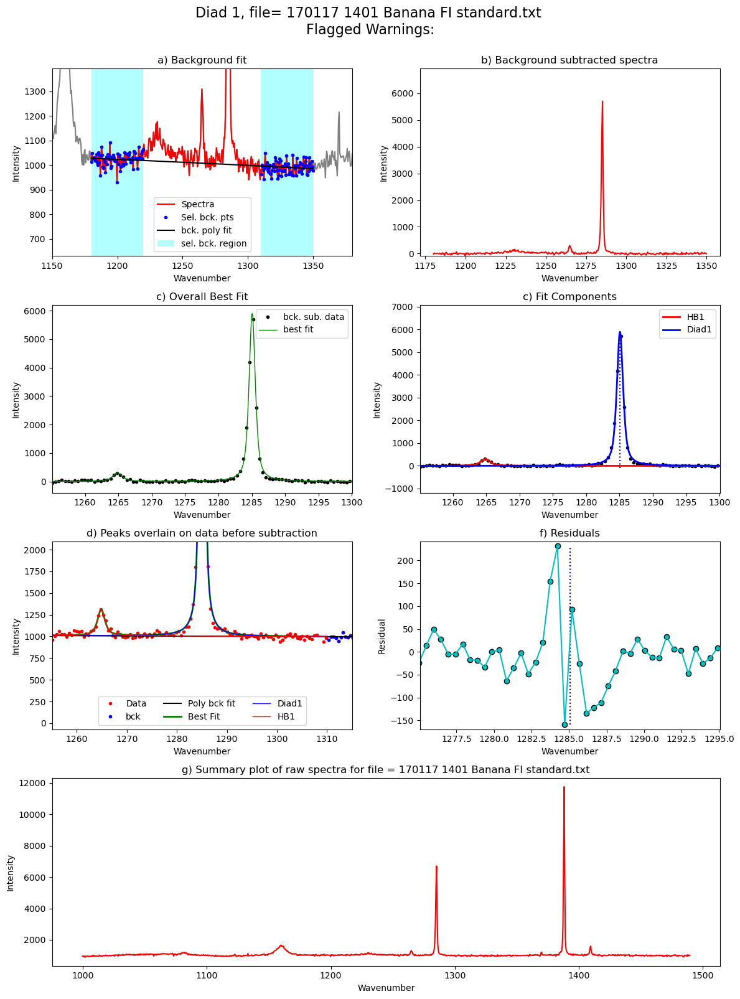

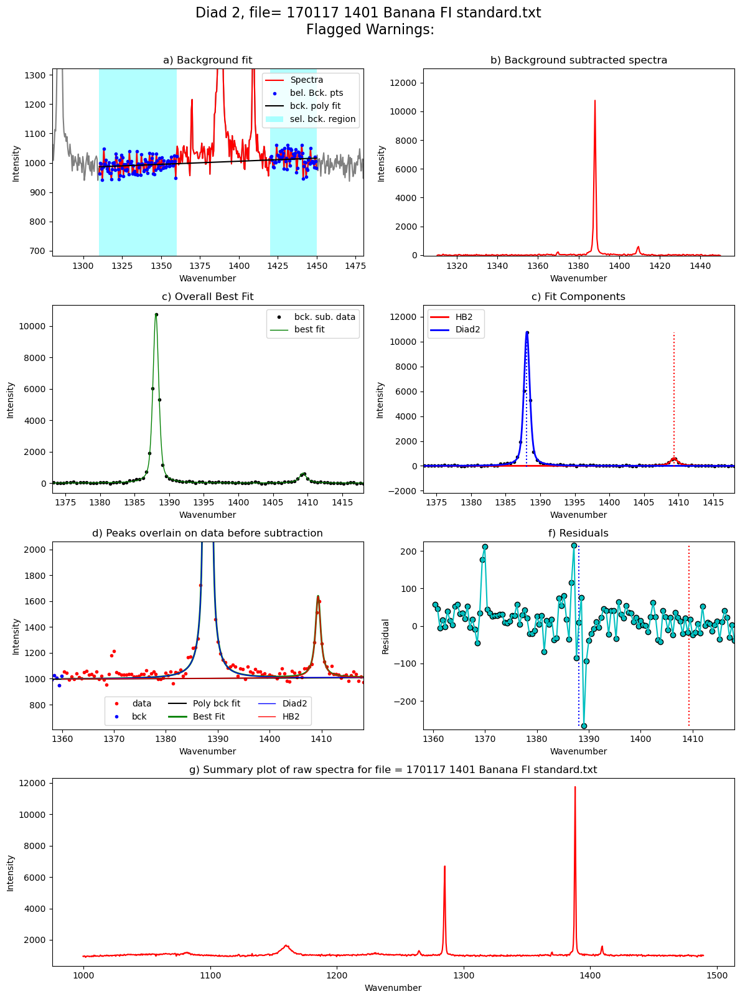

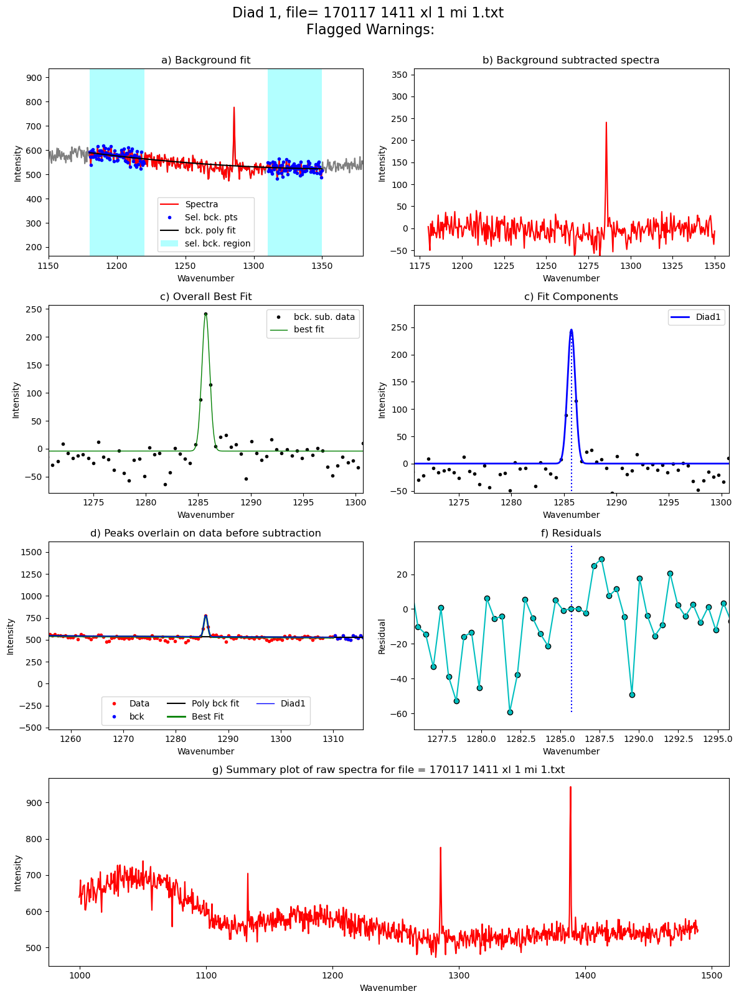

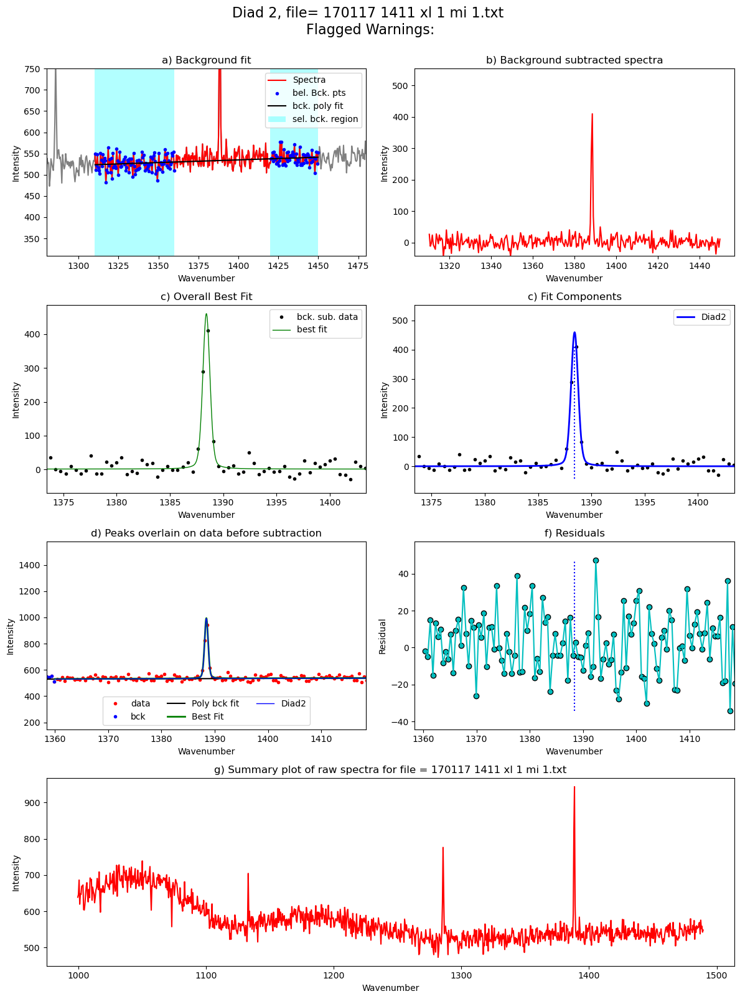

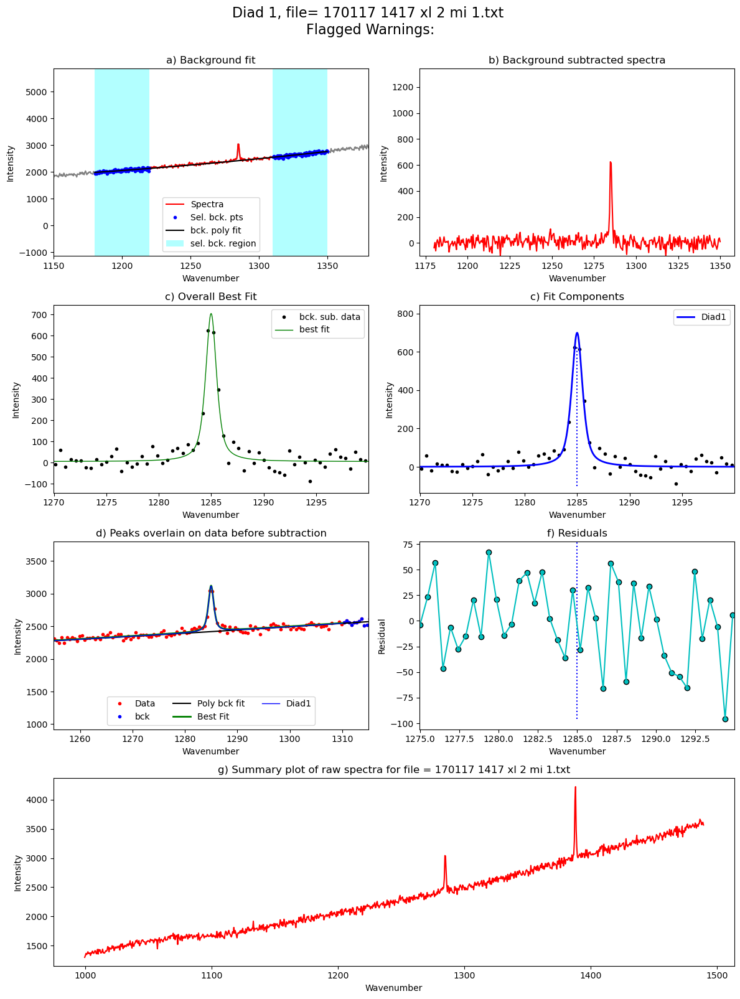

...

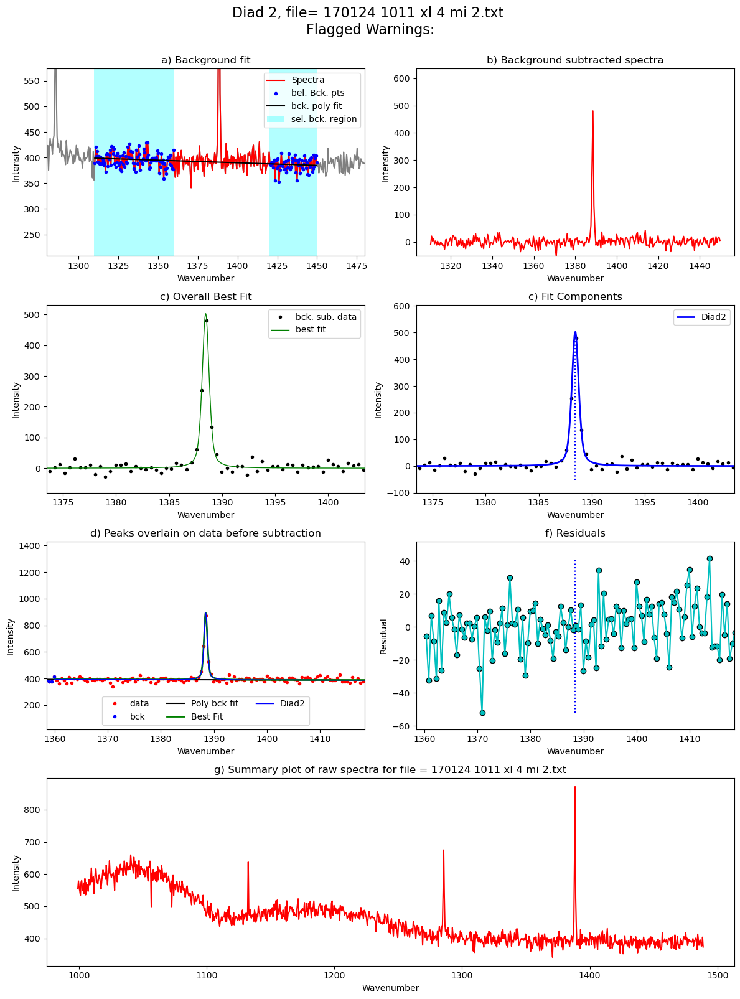

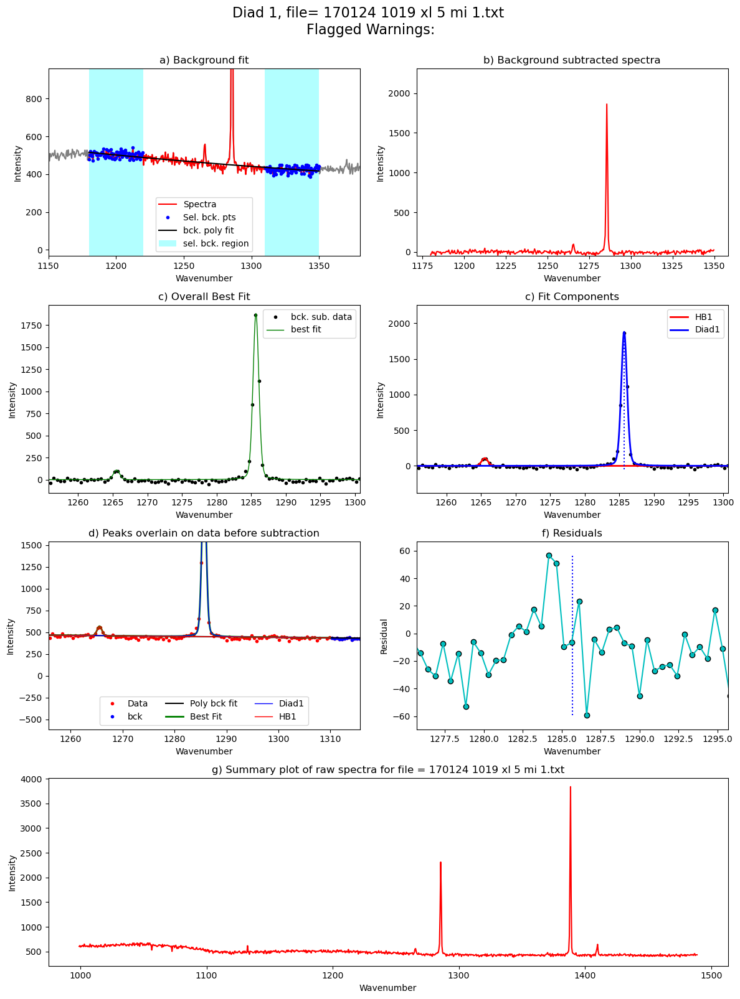

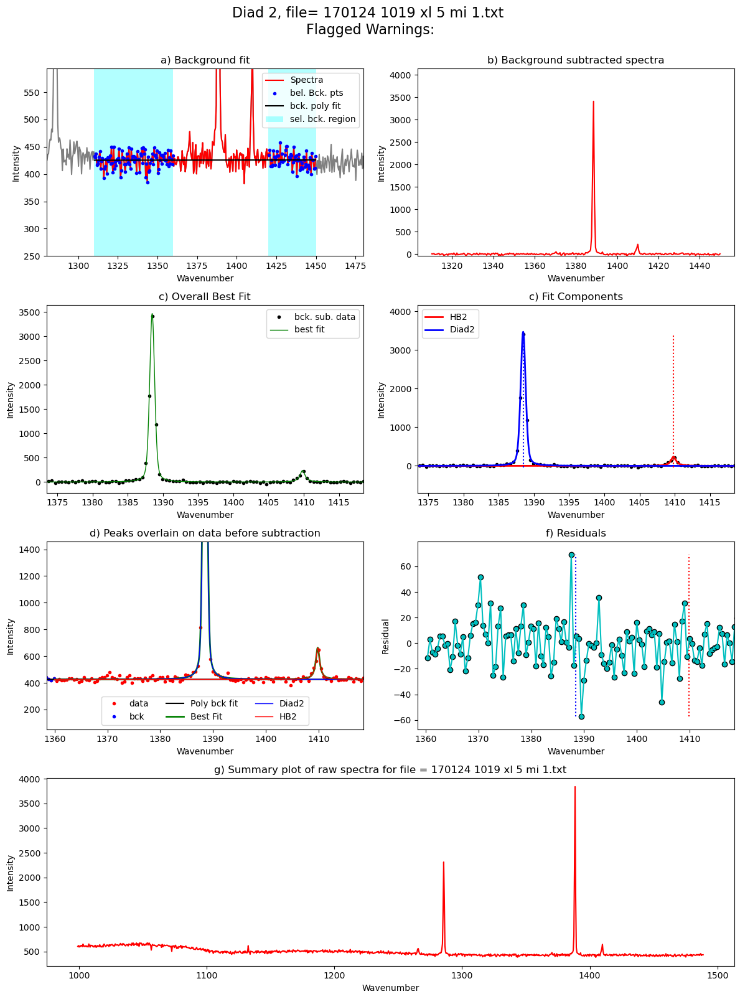

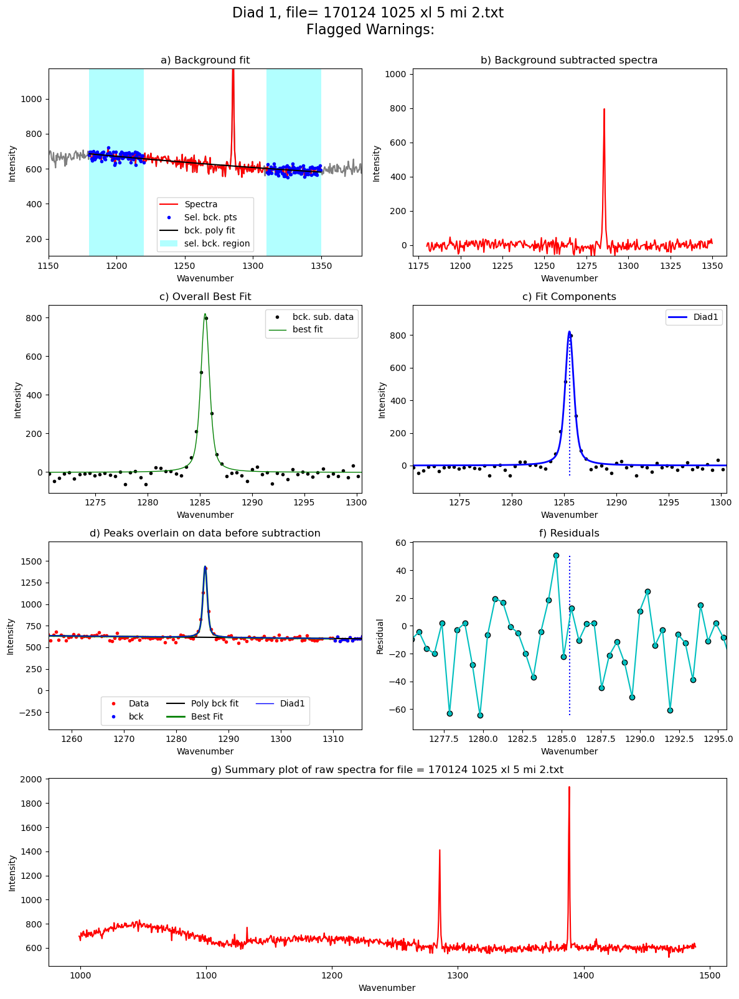

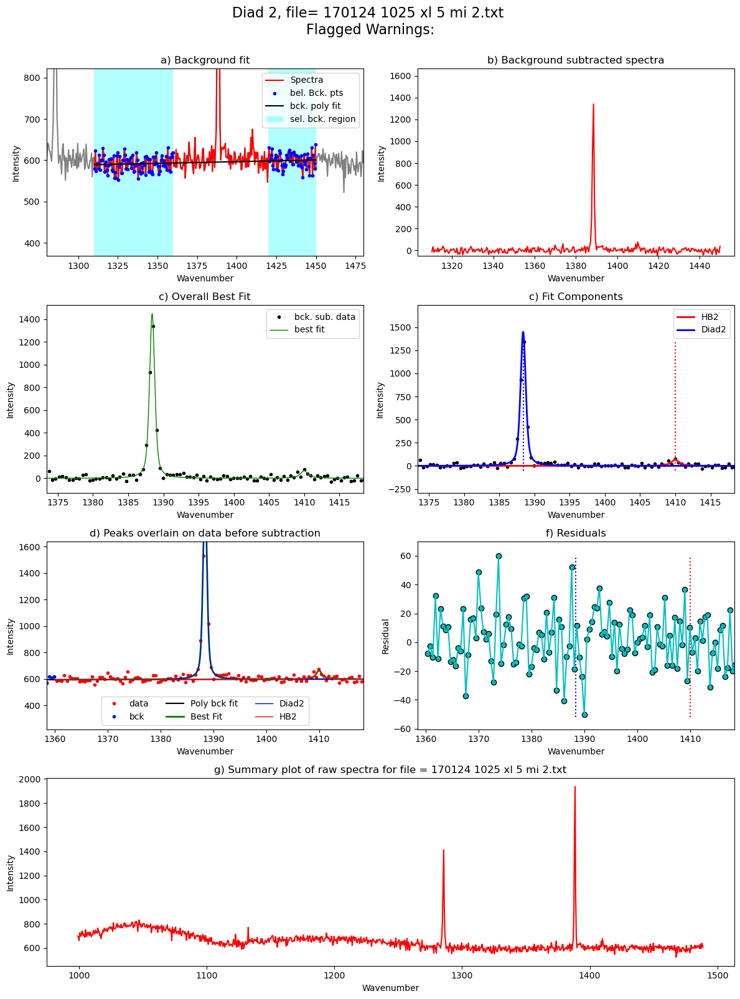

In [35]:
from tqdm import tqdm
plot_figure=True# If False, Means doesnt have to make figures, lot faster. 
close_figure=False # If True, wont show figures in notebook, but will still save them in a folder 
Diad_Files_i=Diad_Files
df_Merge = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files))): #
    tqdm.write(f"Processing file: {Diad_Files[i]}")
    
    
    # For diad1, config file like you had in the previous. 
    # Only really used to exclude a range (say your spectra has a known spec)
    diad_id_config=pf.diad_id_config(exclude_range1=[1308, 1309])
    
    # Here, the prominence are taken from the fitting in the last notebook
    diad1_fit_config2.HB_prom=GroupN_df['HB1_abs_prom'].iloc[i]
    diad1_fit_config2.diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i]
    diad1_fit_config2.gauss_amp=2*GroupN_df['HB1_abs_prom'].iloc[i]

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config2,
    config2=diad_id_config, path=spectra_path, filename=GroupN_df['filename'].iloc[i],
    filetype=filetype, plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
    HB_pos=GroupN_df['HB1_pos'].iloc[i])

    ## Same for diad2, just also has a C13 peak
    diad2_fit_config_init.HB_prom=GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i]
    diad2_fit_config_init.gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.C13_prom=GroupN_df['C13_abs_prom'].iloc[i]
    
    
    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
        config2=diad_id_config,
    path=spectra_path, filename=GroupN_df['filename'].iloc[i], 
    filetype=filetype,
    plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
    HB_pos=GroupN_df['HB2_pos'].iloc[i], 
    C13_pos=GroupN_df['C13_pos'].iloc[i])
    
    # This combines the outputs into a single dataframe
    data=pf.combine_diad_outputs(filename=GroupN_df['filename'].iloc[i], prefix=prefix, 
    Diad1_fit=Diad1_fit, path=spectra_path,                  
    Diad2_fit=Diad2_fit)        
    
 

    df_Merge = pd.concat([df_Merge, data], axis=0).reset_index(drop=True)


In [36]:
# Save parameters to excel
combo=df_Merge

if batch=='Weak':
    combo.to_excel('Weak_Diads.xlsx', index=False)
if batch=='Medium':
    combo.to_excel('Medium_Diads.xlsx', index=False)
if batch=='Strong':
    combo.to_excel('Strong_Diads.xlsx', index=False)

In [37]:
combo

,filename,Splitting,Split_σ,Diad1_Combofit_Cent,Diad1_cent_err,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Residual,...,HB2_Sigma,C13_Cent,C13_Area,C13_Sigma,Diad2_Gauss_Cent,Diad2_Gauss_Area,Diad2_Gauss_Sigma,Diad1_Gauss_Cent,Diad1_Gauss_Area,Diad1_Gauss_Sigma
0,170117 1401 Banana FI standard,103.011347,0.004523,1285.061171,0.004069,5901.241819,1285.061221,9262.889550,0.561751,37.692103,...,0.609536,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,170117 1411 xl 1 mi 1,102.706357,0.039978,1285.716103,0.036150,241.847403,1285.716103,229.726145,0.438656,14.818391,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,170117 1417 xl 2 mi 1,102.959300,0.033391,1284.993780,0.029519,704.915962,1284.993780,1209.285595,0.618433,28.613346,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,170117 1430 xl 2 mi 2,103.087576,0.009846,1284.817111,0.009070,1167.449181,1284.817161,2086.546846,0.674207,14.235162,...,0.776243,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,170117 1449 xl 2 mi 3,103.055303,0.014721,1284.873839,0.013588,727.588985,1284.873839,1108.813372,0.661404,13.907954,...,0.559241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,170117 1456 xl 3 mi 1,102.686259,0.030213,1285.767567,0.026710,304.165472,1285.767567,261.600321,0.398967,13.126807,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,170117 1502 xl 3 mi 2,102.873221,1.629593,1285.488340,1.626271,77.792343,1285.488340,38.640141,0.220000,12.149025,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,170117 1515 xl 4 mi 1,102.709342,0.020723,1285.667010,0.011657,712.436170,1285.667010,725.222746,0.431403,13.035565,...,0.408232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,170117 1525 xl 4 mi 2,102.874747,0.049641,1285.421033,0.044065,188.998907,1285.421033,202.454694,0.497910,12.668717,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,170117 1533 xl 5 mi 1,102.816355,0.005485,1285.501414,0.004723,2218.389904,1285.501414,2583.719211,0.420261,16.240488,...,0.407968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### This plays a sound when the notebook is done if you have a tendency to procrastinate

In [ ]:
# !pip install winotify

from winotify import Notification, audio

toast= Notification(app_id="VSCode",title="Notebook completed",
                    msg="Step3b_Secondary_Peaks is done!",
                    duration="short")
toast.set_audio(audio.Mail,loop=False)
toast.show()